In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import os
from PIL import Image, ImageFilter
from ultralytics import YOLO
import random

In [2]:
from helper_functions import set_logging

# Validation results

In [3]:
results_path = "./runs/train/food_detection_yolo11_nano"

In [4]:
result_plots_images = [
    "PR_curve.png",
    "F1_curve.png",
    "P_curve.png",
    "R_curve.png",
    "results.png",
]

result_images_examples = [
    ("val_batch0_labels.jpg", "val_batch0_pred.jpg"),
    ("val_batch1_labels.jpg", "val_batch1_pred.jpg"),
    ("val_batch2_labels.jpg", "val_batch2_pred.jpg"),
]


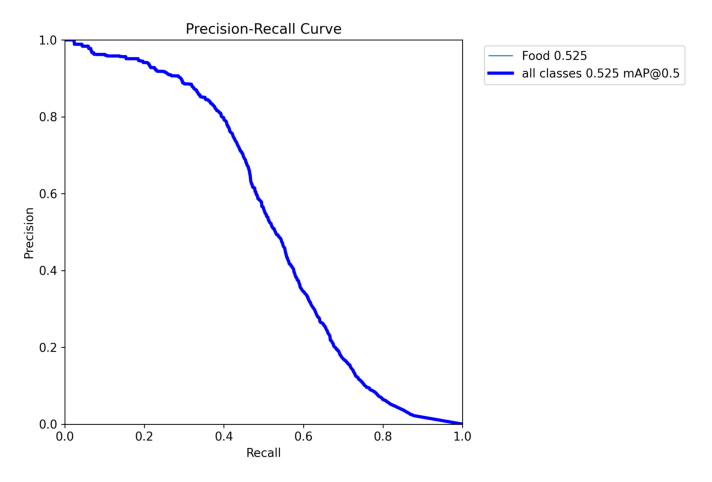

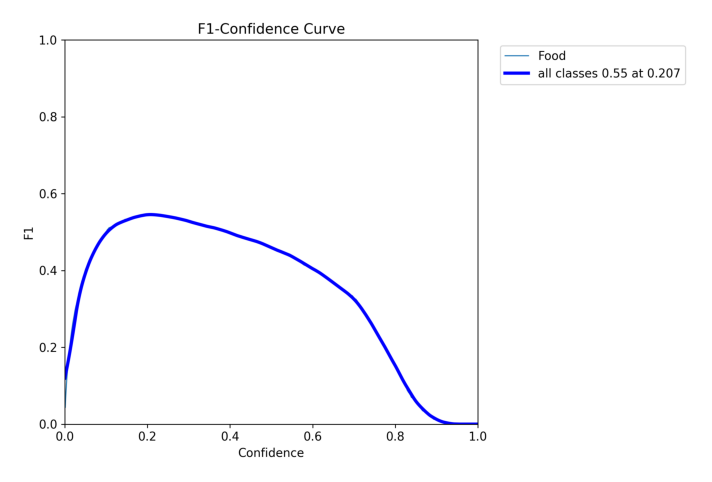

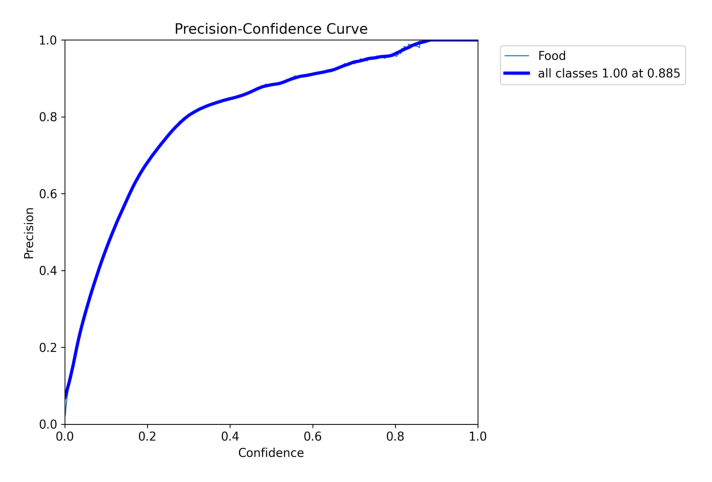

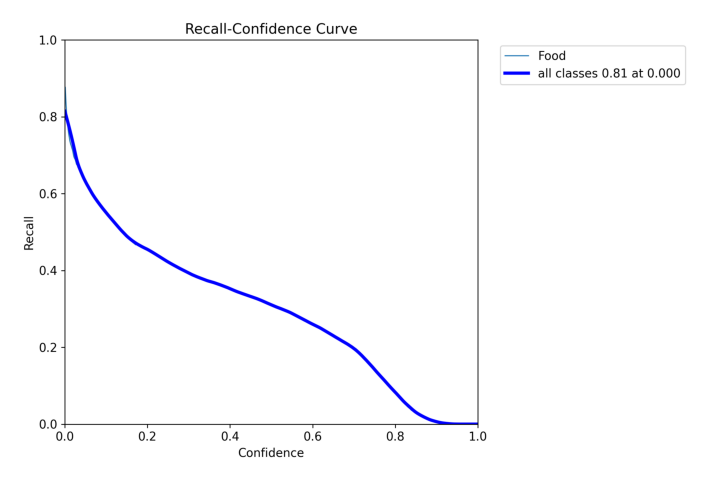

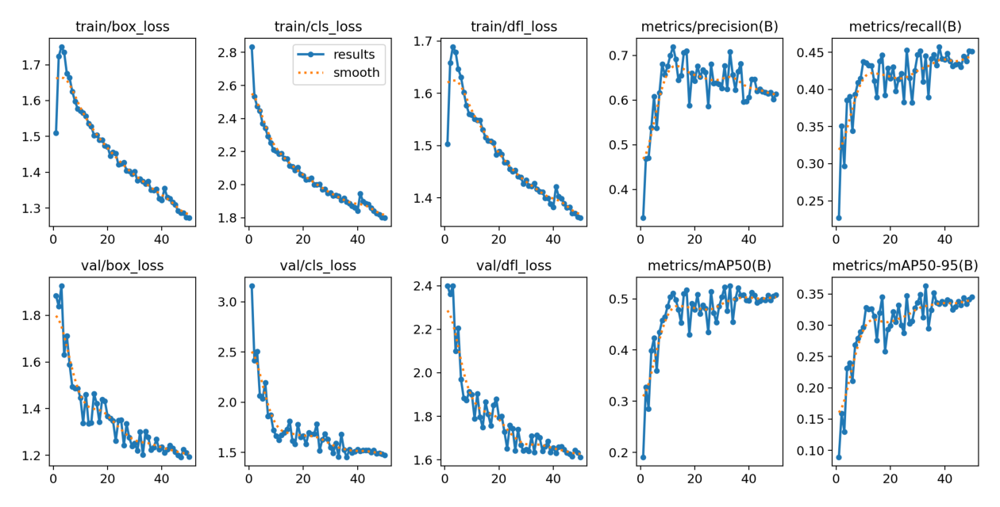

In [5]:
for file in result_plots_images:
    img_path = os.path.join(results_path, file)
    img = Image.open(img_path)
    if file == "results.png":
        plt.figure(figsize=(16, 12))
    else:
        plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

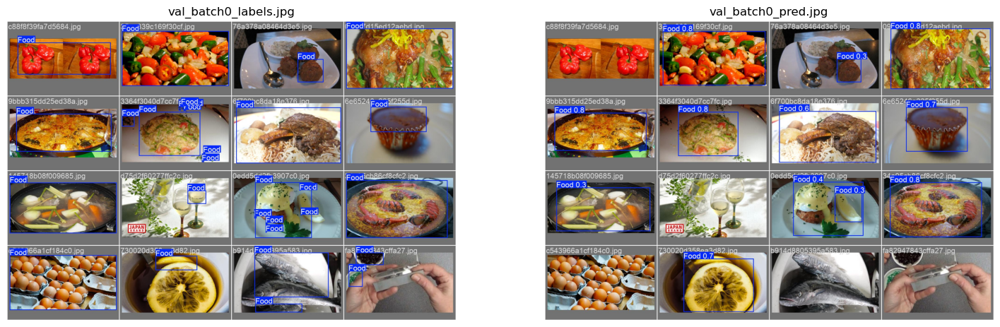

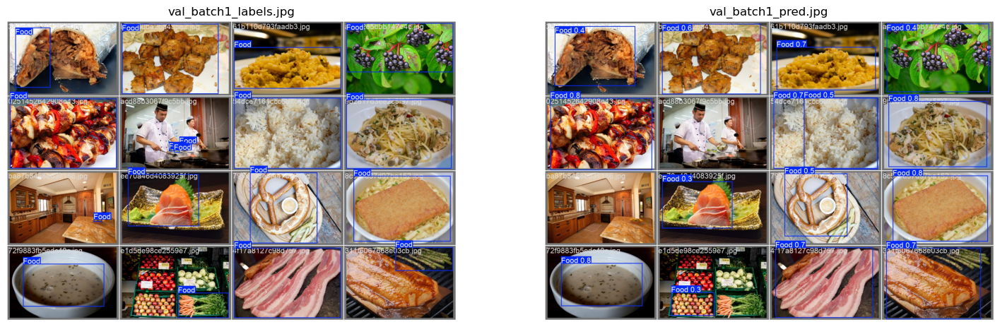

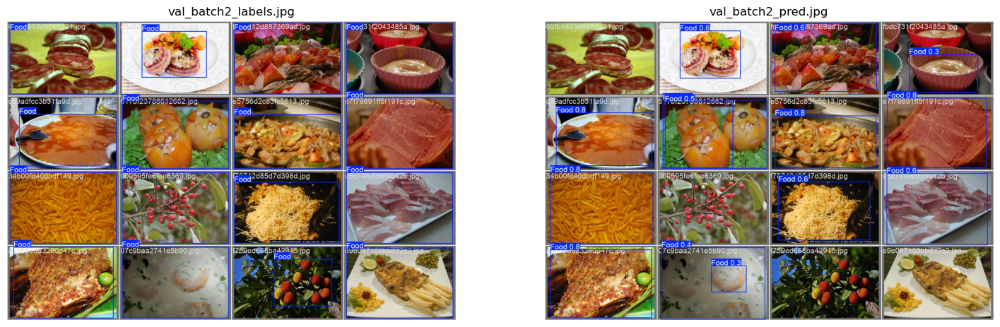

In [6]:
for file1, file2 in result_images_examples:
    img_path1 = os.path.join(results_path, file1)
    img_path2 = os.path.join(results_path, file2)
    img1 = Image.open(img_path1)
    img2 = Image.open(img_path2)
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 16))
    axes[0].imshow(img1)
    axes[0].axis('off')
    axes[0].set_title(file1)
    axes[1].imshow(img2)
    axes[1].axis('off')
    axes[1].set_title(file2)
    
    plt.show()

# Blur detected food regions with best model and selected confidence score

In [7]:
best_model_path = os.path.join(results_path, "weights/best.pt")
validation_images_path = "./images/validation"

In [8]:
model = YOLO(best_model_path)

In [9]:
set_logging(show_logs=False)

In [10]:
def blur_detected_regions(img_path, conf=0.2):
    img = Image.open(img_path)
    preds = model(img, conf=conf)[0]
    img_blurred = img.copy()
    
    for coords in preds.boxes.xyxy:
        x1, y1, x2, y2 = map(int, coords)
        region = img_blurred.crop((x1, y1, x2, y2))
        blurred_region = region.filter(ImageFilter.GaussianBlur(radius=15))
        img_blurred.paste(blurred_region, (x1, y1, x2, y2))
    
    return img, img_blurred

In [11]:
def display_blurred_detections(validation_images, conf=0.2):
    for img_path in validation_images:
        original, blurred = blur_detected_regions(img_path, conf=conf)
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(original)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        
        axes[1].imshow(blurred)
        axes[1].axis('off')
        axes[1].set_title("Blurred Predicted Regions")
        
        plt.show()

In [15]:
all_validation_images = [os.path.join(validation_images_path, img) for img in os.listdir(validation_images_path)]
random_validation_images = random.sample(all_validation_images, 15)


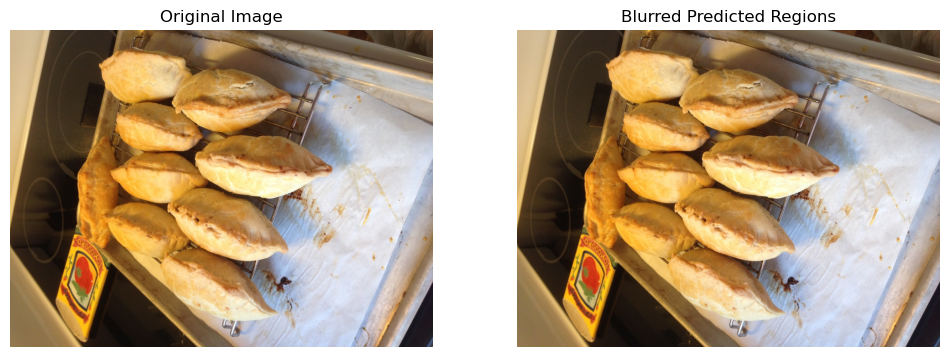

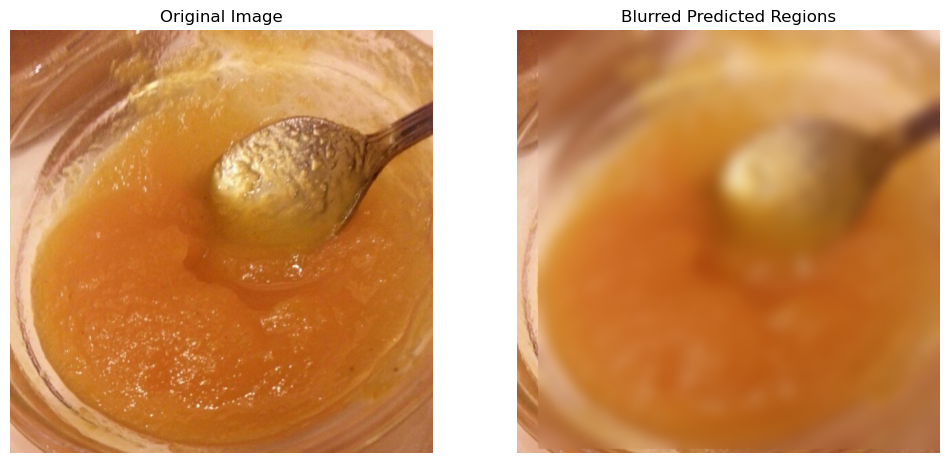

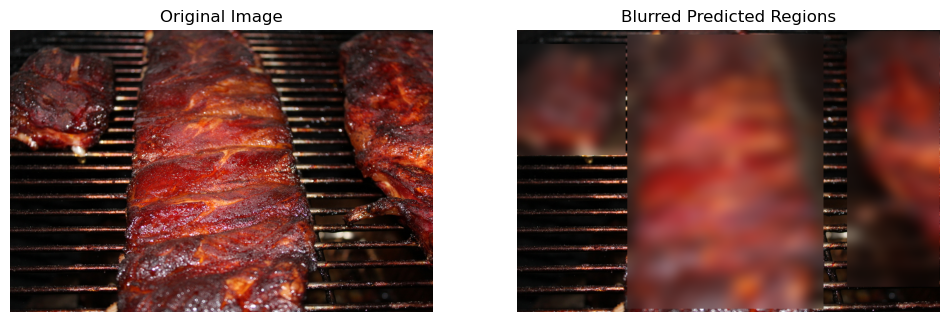

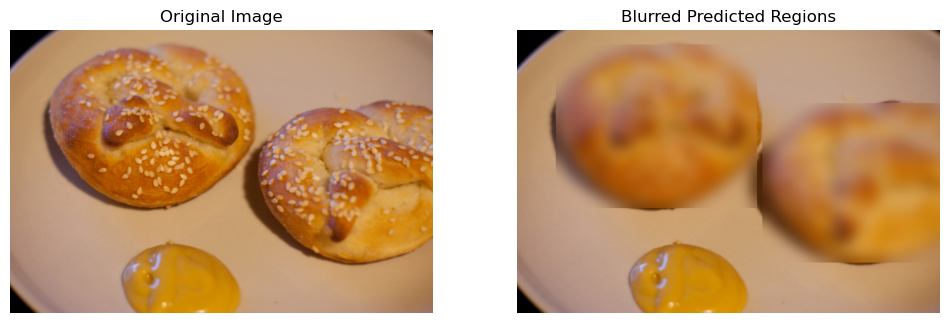

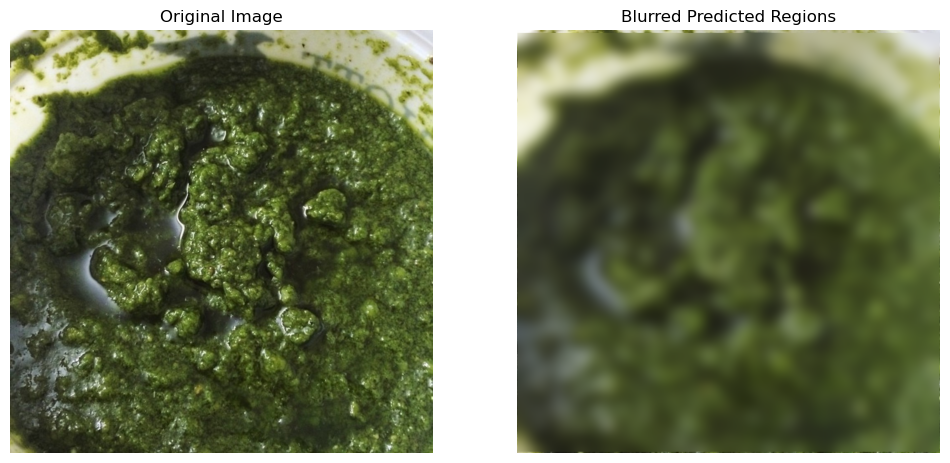

...

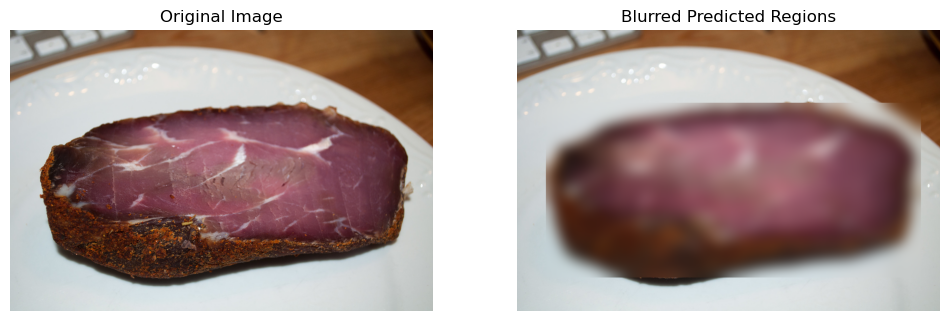

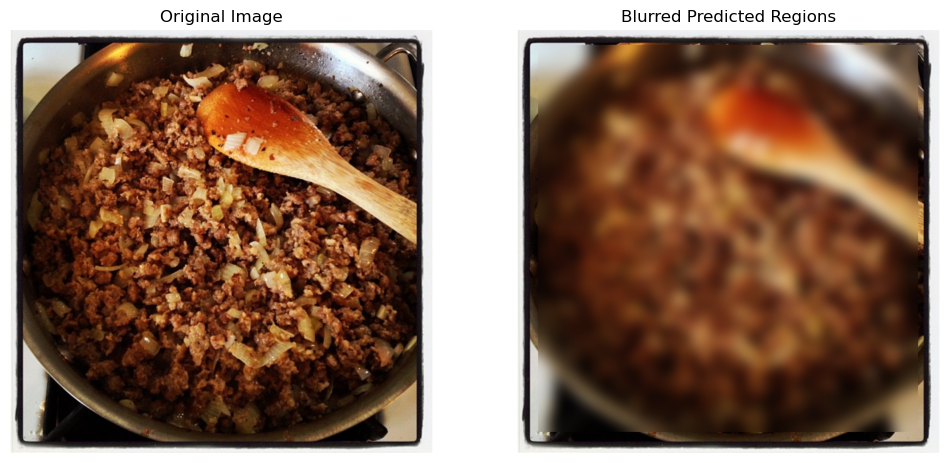

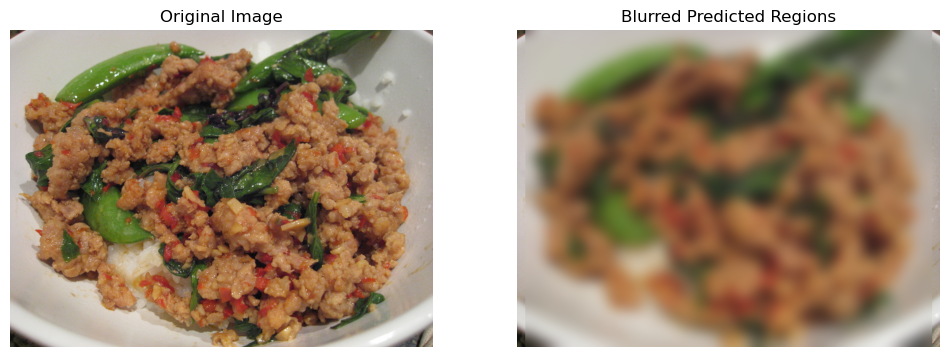

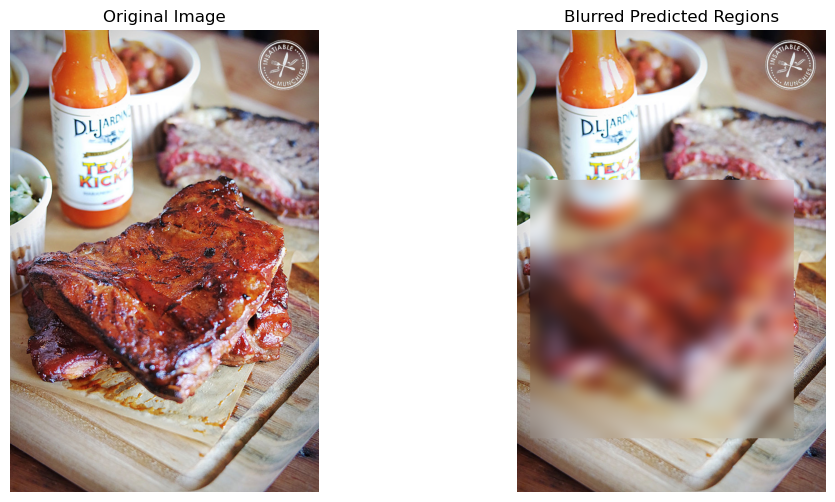

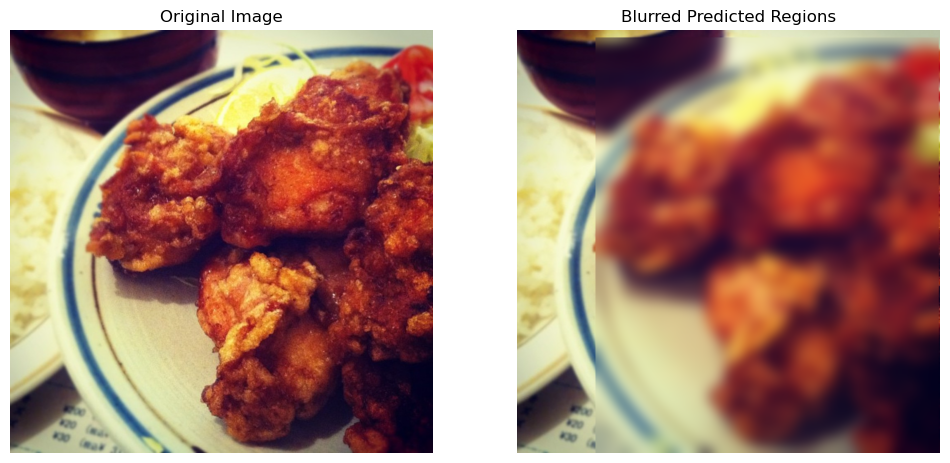

In [16]:
display_blurred_detections(random_validation_images, conf=0.2)